In [1]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
with open("../Names.txt", 'r') as f:
    names = f.read().split('\n')

In [3]:
len(names)

55692

In [4]:
print(np.unique(list(''.join(names))))

[' ' '-' '.' 'A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'O'
 'P' 'Q' 'R' 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z' 'a' 'b' 'c' 'd' 'e' 'f' 'g'
 'h' 'i' 'j' 'k' 'l' 'm' 'n' 'o' 'p' 'q' 'r' 's' 't' 'u' 'v' 'w' 'x' 'y'
 'z']


In [5]:
stopchars = [" ","-","."]

In [6]:
names = [name.lower() for name in names if not any(char in stopchars for char in name)]

In [7]:
chars = np.unique(['!']+list(''.join(names)))

In [8]:
char_index = dict()
for char in chars:
    char_index[char] = len(char_index)

In [9]:
window_length = 3
Xs,ys = [],[]
for name in names:
    window = [0]*window_length
    for c in name+'!':
        Xs.append(window)
        ys.append(char_index[c])
        window = window[1:]+[char_index[c]]

In [10]:
Xs = torch.tensor(Xs)
ys = torch.tensor(ys)

In [11]:
# The training data as window vs next word
for i in list(map(lambda x : str(x[0]) + ' => ' + str(x[1]),list(zip([[chars[x] for x in X] for X in Xs],[chars[y] for y in ys])))):
    print(i)

['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => a
['a', 'b', 'a'] => n
['b', 'a', 'n'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => r
['h', 'a', 'r'] => a
['a', 'r', 'a'] => n
['r', 'a', 'n'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => s
['h', 'a', 's'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => t
['h', 'a', 't'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => e
['b', 'h', 'e'] => e
['h', 'e', 'e'] => r
['e', 'e', 'r'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => e
['b', 'h', 'e'] => e
['h', 'e', 'e'] => r
['e', 'e', 'r'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => b
['!', 'a', 'b

In [12]:
Xs.shape, Xs.dtype, ys.shape, ys.dtype

(torch.Size([494648, 3]), torch.int64, torch.Size([494648]), torch.int64)

In [13]:
# Creating an embedding space of dim 2 to embed each character
C = torch.randn((len(chars), 2), requires_grad=True)

In [14]:
C

tensor([[ 0.9481, -0.8844],
        [-1.3027, -0.3283],
        [ 0.3588, -2.0854],
        [-0.0814, -1.0442],
        [ 0.4020,  2.0139],
        [-0.1739, -0.1163],
        [-0.8068, -0.0636],
        [ 0.2035, -0.9077],
        [ 0.4817,  1.2495],
        [ 1.7626,  1.4334],
        [-1.1539, -0.3743],
        [ 0.9248,  0.7513],
        [ 0.8247, -0.0041],
        [-1.7728,  0.2666],
        [ 1.0962, -2.2176],
        [ 0.9739, -0.0276],
        [ 0.7555, -1.6774],
        [ 0.3908, -0.0870],
        [-1.5232,  1.0700],
        [ 0.2466, -0.8133],
        [ 0.5334,  1.1017],
        [-0.6904,  0.0425],
        [ 0.4887, -1.0311],
        [ 0.6118,  0.3308],
        [ 0.7253, -1.3564],
        [-0.5972,  1.4032],
        [-0.1771, -0.0327]], requires_grad=True)

In [15]:
emb=C[Xs]

In [16]:
W = torch.randn((6,100))
b = torch.randn((100))

In [17]:
h = torch.tanh(emb.reshape(-1,6) @ W + b)

In [18]:
h.shape

torch.Size([494648, 100])

In [19]:
W2 = torch.randn(100,len(chars))
b2 = torch.randn(len(chars))

In [20]:
h = torch.softmax(h @ W2 + b2, dim=1)

In [21]:
h.shape

torch.Size([494648, 27])

In [22]:
loss = -h[torch.arange(len(h)), ys].log().mean() #negative log likelihood loss

In [23]:
loss

tensor(18.8019, grad_fn=<NegBackward0>)

Neater code

In [24]:
C = torch.randn((len(chars), 2), requires_grad=True)
W1 = torch.randn((6,100))
b1 = torch.randn((100))
W2 = torch.randn(100,len(chars))
b2 = torch.randn(len(chars))
parameters = [W1,b1,W2,b2,C]

In [25]:
sum(p.nelement() for p in parameters)

3481

In [26]:
for p in parameters:
    p.requires_grad = True

In [27]:
lre = np.linspace(-3,0,1000)
lrs = 10**lre

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=0.1, random_state=42)
X_train,X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [29]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= lrs[i] * p.grad
    losses.append(loss.item())
    exp_rates.append(lre[i])

In [30]:
loss.item()

7.335056781768799

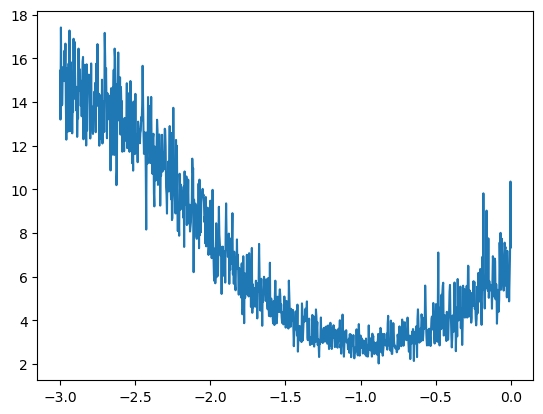

In [31]:
plt.plot(exp_rates,losses)

In [32]:
#10**-1 = 0.1 seems to be the right learning rate
batch_size=32
losses = []
for i in range(10000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.1 * p.grad
print(loss.item())

2.2681822776794434


In [33]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(Xs), (batch_size,))
    x_batch=Xs[batch]
    y_batch=ys[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), ys].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.01 * p.grad
print(loss.item())

2.354215383529663


In [34]:
emb = C[X_train]
logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
train_loss = F.cross_entropy(logits, y_train)
emb = C[X_val]
logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
val_loss = F.cross_entropy(logits, y_val)
print(f'Train loss: {train_loss.item()}, Val loss: {val_loss.item()}')

Train loss: 2.167510747909546, Val loss: 2.1691508293151855


In [35]:
#Old model is underfitting, so we make a new model
C = torch.randn((len(chars), 5), requires_grad=True)
W1 = torch.randn((5*3,300))
b1 = torch.randn((300))
W2 = torch.randn(300,len(chars))
b2 = torch.randn(len(chars))
parameters = [W1,b1,W2,b2,C]

In [36]:
sum(p.nelement() for p in parameters)

13062

In [37]:
for p in parameters:
    p.requires_grad = True

In [38]:
lre = np.linspace(-3,0,1000)
lrs = 10**lre

In [39]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= lrs[i] * p.grad
    losses.append(loss.item())
    exp_rates.append(lre[i])

In [40]:
loss.item()

11.816322326660156

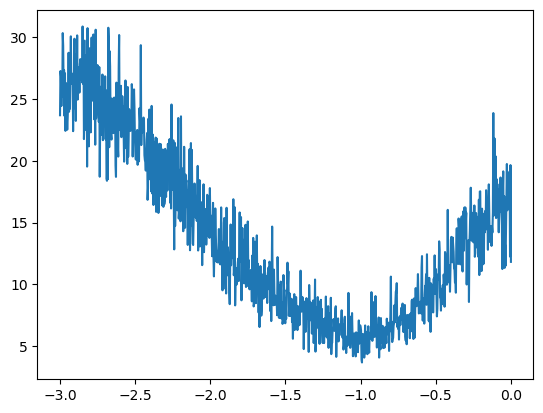

In [41]:
plt.plot(exp_rates,losses)

In [50]:
#10**-1 = 0.1 seems to be the right learning rate
batch_size=32
losses = []
for i in range(10000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.1 * p.grad
print(loss.item())

1.9088093042373657


In [52]:
# divided lr by 10
batch_size=32
losses = []
for i in range(10000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.01 * p.grad
print(loss.item())

1.8705668449401855


In [53]:
emb = C[X_train]
logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
train_loss = F.cross_entropy(logits, y_train)
emb = C[X_val]
logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
val_loss = F.cross_entropy(logits, y_val)
emb = C[X_test]
logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
test_loss = F.cross_entropy(logits, y_test)
print(f'Train loss: {train_loss.item()}, Val loss: {val_loss.item()}, Test loss: {test_loss}')

Train loss: 2.008427143096924, Val loss: 2.031625509262085, Test loss: 2.019514799118042


In [54]:
import pickle
torch.save(C, 'C.pt')
torch.save(W1, 'W1.pt')
torch.save(b1, 'b1.pt')
torch.save(W2, 'W2.pt')
torch.save(b2, 'b2.pt')
with open('chars.pkl', 'wb') as f:
    pickle.dump(chars, f)
with open('char_index.pkl', 'wb') as f:
    pickle.dump(char_index, f)